In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from dython.nominal import associations

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")

## **Загрузка датасета и просмотр основной по нему информации**

In [2]:
df = pd.read_csv("surveys.csv")

In [3]:
new_names = [
    'Отрасль',
    'Направление',
    'Бюджет',
    'Время на внедрение',
    'Миссия',
    'Цели',
    'Риски',
    'Ресурсы',
    'Бизнес-модель',
    'Нормативно-правовая база',
    'Охват',
    'Структура собстенности',
    'Конкурентная среда',
    'Целевой рынок',
    'Ценовая стратегия',
    'Основной продукт',
    'Каналы сбыта',
    'Доствка',
    'Количество сотрудников',
    'Обучение персонала',
    'Инструмент коммуникации',
    'Инструменты совместной работы',
    'Работа вне офиса',
    'Уровень автоматизации',
    'Маркетинговая стратегия',
    'Бренд-стратегия',
    'Стратегия удержания клиентов',
    'Платформа социальных сетей',
    'Функциональные возможности',
    'Соответсвие арх. пред. орг. струк.',
    'Бизнес-процессы',
    'Аппаратное обеспечение',
    'Программное обеспечение',
    'Безопасность',
    'Резервное копирование',
    'Масштабируемость',
    'Интеграция',
    'Техническая поддержка',
    'Гарантийные обязательства',
    'Отчётность',
    'Эксплуатационная документация',
    'Аналитика и прогнозирование',
    'Управление данными',
    'Пользовательский интерфейс',
    'Открытое ПО', 
    'Класс'
]

In [4]:
df.columns = new_names

In [5]:
checkbox_questions = [
    'Риски', 'Ресурсы', 'Каналы сбыта', 'Маркетинговая стратегия', 'Функциональные возможности',
    'Бизнес-процессы', 'Аппаратное обеспечение', 'Программное обеспечение', 'Безопасность',
    'Масштабируемость', 'Интеграция', 'Техническая поддержка', 'Гарантийные обязательства',
    'Отчётность', 'Эксплуатационная документация', 'Аналитика и прогнозирование',
    'Управление данными', 'Пользовательский интерфейс'
]

In [6]:
regular_questions = [
    'Отрасль', 'Направление', 'Бюджет', 'Время на внедрение', 'Миссия', 
    'Цели', 'Бизнес-модель', 'Нормативно-правовая база', 'Охват', 'Структура собстенности', 
    'Конкурентная среда', 'Целевой рынок', 'Ценовая стратегия', 'Основной продукт', 'Доствка', 
    'Количество сотрудников', 'Обучение персонала', 'Инструмент коммуникации', 
    'Инструменты совместной работы', 'Работа вне офиса', 'Уровень автоматизации', 
    'Бренд-стратегия', 'Стратегия удержания клиентов', 'Платформа социальных сетей', 
    'Соответсвие арх. пред. орг. струк.', 'Резервное копирование', 'Открытое ПО'
]

In [7]:
df.head()

,Отрасль,Направление,Бюджет,Время на внедрение,Миссия,Цели,Риски,Ресурсы,Бизнес-модель,Нормативно-правовая база,...,Интеграция,Техническая поддержка,Гарантийные обязательства,Отчётность,Эксплуатационная документация,Аналитика и прогнозирование,Управление данными,Пользовательский интерфейс,Открытое ПО,Класс
0,Финансы и страхование,Розничная торговля,от 10 до 20 процентов от общего бюджета,от 6 месяцев до 1 года,Стремление к лидерству в отрасли и расширение ...,Расширение ассортимента товаров и услуг.,"Экономические риски, Технологические риски, Ри...","Информационные ресурсы (например, базы данных)...",Определение целевой аудитории и ее потребностей.,Строго регулируемая,...,"Интеграция с бухгалтерскими системами, Интегра...","Техническая поддержка 24/7, Ответы в течение о...","Гарантия на аппаратное обеспечение, Гарантия н...",Предоставление стандартных отчетов по продажам...,Предоставление технической документации на рус...,"Возможность прогнозирования продаж и доходов, ...",Возможность импорта данных из других систем (E...,"Совместимость с различными устройствами, Совме...","С некоторым опасением, не уверен, что это дост...",Финансовый
1,Производство,Предоставление услуг,от 10 до 20 процентов от общего бюджета,от 3 до 6 месяцев,Инновации и внедрение новых технологий для улу...,Улучшение качества обслуживания клиентов.,"Риски связанные с персоналом, Риски связанные ...","Материальные ресурсы (например, оборудование)",Определение целевой аудитории и ее потребностей.,Умеренно регулируемая,...,"Интеграция с бухгалтерскими системами, Интегра...",Ответы в течение определенного времени,"Гарантия на аппаратное обеспечение, Гарантия н...",Предоставление стандартных отчетов по продажам...,Предоставление информации о стандартах и норма...,Возможность анализа эффективности маркетинговы...,"Хранение данных, Возможность очистки и дедубли...","Интуитивно понятный интерфейс, Многоязычный ин...",Нейтрально,Доставка и хранение
2,Торговля,Розничная торговля,от 20 до 30 процентов от общего бюджета,от 6 месяцев до 1 года,Стремление к лидерству в отрасли и расширение ...,Расширение ассортимента товаров и услуг.,"Экономические риски, Технологические риски, Ри...","Материальные ресурсы (например, оборудование),...",Определение целевой аудитории и ее потребностей.,Умеренно регулируемая,...,"Интеграция с бухгалтерскими системами, Интегра...","Техническая поддержка 24/7, Ответы в течение о...","Гарантия на аппаратное обеспечение, Гарантия н...",Предоставление стандартных отчетов по продажам...,Предоставление технической документации на рус...,Предоставление стандартных аналитических отчет...,"Хранение данных, Возможность очистки и дедубли...","Интуитивно понятный интерфейс, Настраиваемый и...","В целом положительно, но зависит от конкретног...",Торговый
3,Торговля,Розничная торговля,от 20 до 30 процентов от общего бюджета,от 6 месяцев до 1 года,Стремление к лидерству в отрасли и расширение ...,Расширение ассортимента товаров и услуг.,"Экономические риски, Технологические риски, Ри...","Материальные ресурсы (например, оборудование),...",Определение целевой аудитории и ее потребностей.,Умеренно регулируемая,...,"Интеграция с бухгалтерскими системами, Интегра...","Техническая поддержка 24/7, Ответы в течение о...","Гарантия на аппаратное обеспечение, Гарантия н...",Предоставление стандартных отчетов по продажам...,Предоставление технической документации на рус...,Предоставление стандартных аналитических отчет...,"Хранение данных, Возможность очистки и дедубли...","Интуитивно понятный интерфейс, Настраиваемый и...","В целом положительно, но зависит от конкретног...",Торговый
4,Торговля,Розничная торговля,от 20 до 30 процентов от общего бюджета,от 6 месяцев до 1 года,Инновации и внедрение новых технологий для улу...,Расширение ассортимента товаров и услуг.,"Экономические риски, Технологические риски, Ри...","Материальные ресурсы (например, оборудование),...",Определение целевой аудитории и ее потребностей.,Строго регулируемая,...,"Интеграция с бухгалтерским

In [8]:
df.describe()

,Отрасль,Направление,Бюджет,Время на внедрение,Миссия,Цели,Риски,Ресурсы,Бизнес-модель,Нормативно-правовая база,...,Интеграция,Техническая поддержка,Гарантийные обязательства,Отчётность,Эксплуатационная документация,Аналитика и прогнозирование,Управление данными,Пользовательский интерфейс,Открытое ПО,Класс
count,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,...,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000
unique,4,4,3,2,2,2,4,8,1,2,...,3,5,5,8,5,8,8,7,5,8
top,Производство,Розничная торговля,от 10 до 20 процентов от общего бюджета,от 6 месяцев до 1 года,Инновации и внедрение новых технологий для улу...,Расширение ассортимента товаров и услуг.,"Экономические риски, Технологические риски, Ри...","Материальные ресурсы (например, оборудование),...",Определение целевой аудитории и ее потребностей.,Умеренно регулируемая,...,"Интеграция с бухгалтерскими системами, Интегра...","Техническая поддержка 24/7, Ответы в течение о...","Гарантия на аппаратное обеспечение, Гарантия н...",Предоставление стандартных отчетов по продажам...,Предоставление технической документации на рус...,Предоставление стандартных аналитических отчет...,"Хранение данных, Возможность очистки и дедубли...","Интуитивно понятный интерфейс, Настраиваемый и...","В целом положительно, но зависит от конкретног...",Торговый
freq,3688,3977,5176,7017,7284,5924,5712,2389,10000,8114,...,5897,2456,4661,2387,3724,2399,2394,3620,5467,2398


In [9]:
def statistics_by_values(DF):
    """
    Напишем функцию для вывода краткой статистики по датасету, включающей информацию о:
    1) уникальных значениях;
    2) нулевых значениях;
    3) пустых значениях;
    4) процентном соотношении для каждого указанного параметра от общего числа данных.
    """
    num_of_unique = DF.nunique()
    num_of_nulls = np.array([])
    for i in DF.columns:
        num_of_nulls = np.append(num_of_nulls, (DF[i] == 0).sum())
    num_of_nans = DF.isna().sum()
    data = {'Уникальные значения': num_of_unique,
            'Процент уникальных значений': num_of_unique/len(DF)*100,
            'Нулевые значения': num_of_nulls, 
            'Процент нулевых значений': num_of_nulls/len(DF)*100,
            'Пустые значения': num_of_nans,
            'Процент пустых значений': num_of_nans/len(DF)*100}
    interesting_values = pd.DataFrame(data, index=DF.columns)
    return interesting_values

In [10]:
statistics_by_values(df)

,Уникальные значения,Процент уникальных значений,Нулевые значения,Процент нулевых значений,Пустые значения,Процент пустых значений
Отрасль,4,0.04,0.0,0.0,0,0.0
Направление,4,0.04,0.0,0.0,0,0.0
Бюджет,3,0.03,0.0,0.0,0,0.0
Время на внедрение,2,0.02,0.0,0.0,0,0.0
Миссия,2,0.02,0.0,0.0,0,0.0
Цели,2,0.02,0.0,0.0,0,0.0
Риски,4,0.04,0.0,0.0,0,0.0
Ресурсы,8,0.08,0.0,0.0,0,0.0
Бизнес-модель,1,0.01,0.0,0.0,0,0.0
Нормативно-правовая база,2,0.02,0.0,0.0,0,0.0


## **Загрузка датасета кейсов**

In [11]:
df_cases = pd.read_csv("surveys_cases.csv")
df_cases.columns = new_names
df_cases

,Отрасль,Направление,Бюджет,Время на внедрение,Миссия,Цели,Риски,Ресурсы,Бизнес-модель,Нормативно-правовая база,...,Интеграция,Техническая поддержка,Гарантийные обязательства,Отчётность,Эксплуатационная документация,Аналитика и прогнозирование,Управление данными,Пользовательский интерфейс,Открытое ПО,Класс
0,Хранение и доставка,Предоставление услуг,от 10 до 20 процентов от общего бюджета,от 3 до 6 месяцев,Предоставление качественных товаров и услуг дл...,Снижение затрат и повышение эффектиности.,"Риски связанные с персоналом, Риски связанные ...","Материальные ресурсы (например, оборудование)",Определение целевой аудитории и ее потребностей.,Умеренно регулируемая,...,"Интеграция с бухгалтерскими системами, Интегра...",Ответы в течение определенного времени,"Гарантия на аппаратное обеспечение, Гарантия н...",Предоставление стандартных отчетов по продажам...,Предоставление информации о стандартах и норма...,Возможность анализа эффективности маркетинговы...,Возможность экспорта данных в другие системы (...,"Интуитивно понятный интерфейс, Многоязычный ин...",Нейтрально,Доставка и хранение
1,Торговля,Оптовая торговля,от 20 до 30 процентов от общего бюджета,от 6 месяцев до 1 года,Стремление к лидерству в отрасли и расширение ...,Увеличение объема продаж и прибыли.,"Экономические риски, Технологические риски, Ри...","Материальные ресурсы (например, оборудование),...",Определение целевой аудитории и ее потребностей.,Умеренно регулируемая,...,"Интеграция с бухгалтерскими системами, Интегра...","Техническая поддержка 24/7, Ответы в течение о...","Гарантия на аппаратное обеспечение, Гарантия н...",Предоставление стандартных отчетов по продажам...,Предоставление технической документации на рус...,Предоставление стандартных аналитических отчет...,"Хранение данных, Возможность очистки и дедубли...","Интуитивно понятный интерфейс, Настраиваемый и...","В целом положительно, но зависит от конкретног...",Торговый
2,IT,Предоставление услуг,от 20 до 30 процентов от общего бюджета,от 3 до 6 месяцев,Инновации и внедрение новых технологий для улу...,Улучшение качества обслуживания клиентов.,"Технологические риски, Риски связанные с персо...","Человеческие ресурсы (например, персонал), Инф...",Определение целевой аудитории и ее потребностей.,Умеренно регулируемая,...,"Интеграция с бухгалтерскими системами, Интегра...",Восстановление данных в случае сбоев или ошибок,"Гарантия на программное обеспечение, Гарантия ...","Возможность создания пользовательских отчетов,...",Предоставление технической документации на рус...,Возможность создания пользовательских аналитич...,Возможность импорта данных из других систем (E...,"Интуитивно понятный интерфейс, Настраиваемый и...","В целом положительно, но зависит от конкретног...",Сервисный
3,Другое,Другое,от 10 до 20 процентов от общего бюджета,от 6 месяцев до 1 года,Инновации и внедрение новых технологий для улу...,Улучшение качества обслуживания клиентов.,"Технологические риски, Риски связанные с персо...","Природные ресурсы (например, земля), Человечес...",Определение целевой аудитории и ее потребностей.,Умеренно регулируемая,...,"Интеграция с системами управления персоналом, ...",Восстановление данных в случае сбоев или ошибок,Гарантия на программное обеспечение,Возможность создания пользовательских отчетов,Предоставление технической документации на рус...,Возможность анализа эффективности маркетинговы...,"Хранение данных, Возможность очистки и дедубли...","Интуитивно понятный интерфейс, Настраиваемый и...",Полностью лоялен,Социально-ориентированный


Добавим датасет кейсов в конец обычного датасета (удалим после всех необходимых преобразований).

In [12]:
df = pd.concat([df, df_cases], ignore_index=True)

## **Преобразование целевой переменной**

In [13]:
# определение целевой переменной
y = df[["Класс"]]
df = df.drop('Класс', axis=1)

In [14]:
# кодирование целевой переменной
y_dict = {'Государственный' : 1,
          'Социально-ориентированный' : 2,
          'Инновационно-исследовательский' : 3,
          'Сервисный' : 4,
          'Доставка и хранение' : 5,
          'Финансовый' : 6,
          'Производстенный' : 7,
          'Торговый' : 8}

y = y.replace(y_dict)

## **Преобразование датасета - использование Label и One Hot Encoder**

In [15]:
class MultiColumnLabelEncoder:
    def __init__(self,columns = None):
        self.columns = columns 

    def fit(self,X,y=None):
        return self 

    def transform(self,X):
        """
        Преобразует столбцы X, указанные в self.columns, используя
        LabelEncoder(). Если столбцы не указаны, преобразует все
        столбцы в Х.
        """

        output = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output

    def fit_transform(self,X,y=None):
        return self.fit(X,y).transform(X)

In [16]:
# лейбл энкодинг для переменных с одним вариантом ответа
df = MultiColumnLabelEncoder(columns = regular_questions).fit_transform(df)

In [17]:
# преобразование стринг формата вопросов с несколькими вариантами ответов в список
for col in checkbox_questions:
    df[col] = df[col].str.split(',')

In [18]:
# one-hot-encoding вопросов с несколькими вариантами ответов
from sklearn.preprocessing import MultiLabelBinarizer
mlb = MultiLabelBinarizer(sparse_output=True)
for i in checkbox_questions:
    df = df.join(
                pd.DataFrame.sparse.from_spmatrix(
                    mlb.fit_transform(df.pop(i)),
                    index=df.index,
                    columns=[i+"_"+str(col) for col in mlb.classes_]))

In [19]:
# возвращение целевой в обработанный датасет
X = df
df = pd.concat([df, y], axis=1)

## **PCA (метод главных компонент)**

In [20]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 'mle')
pca_features = pca.fit_transform(X)
pca_X = pd.DataFrame(data=pca_features)
pca_X

,0,1,2,3,4,5,6,7,8,9,...,109,110,111,112,113,114,115,116,117,118
0,0.661691,4.712199,4.509405,-0.359289,-1.200840,0.225424,-0.421210,-0.093824,0.191956,-0.050222,...,-0.063448,0.019432,-0.018972,-0.034371,-0.039476,0.126043,-0.025920,-0.018504,-0.000937,-0.000635
1,2.880222,-2.992289,-0.498113,4.415542,-1.423245,0.244063,-0.258382,0.121533,0.112374,-0.066617,...,-0.015233,0.017206,0.020780,0.551335,-0.121277,-0.044254,-0.023771,0.011871,-0.000503,-0.000299
2,-4.291043,2.170305,-2.292442,1.520032,0.342253,-0.075863,-0.055641,0.019589,-0.039204,-0.093773,...,0.006255,0.004394,0.008154,-0.053669,-0.047382,-0.011310,-0.224310,-0.053265,0.000208,-0.000328
3,-4.470953,2.510552,-2.205985,1.204461,-0.139383,-0.469037,0.518197,-0.078143,0.174383,0.546598,...,0.000520,0.006330,-0.010243,0.001261,0.077155,-0.338939,0.015313,0.060100,-0.001114,-0.001770
4,-4.032921,1.959568,-2.089070,1.433867,0.107097,-0.073800,0.165983,0.071507,-0.153487,-0.069381,...,0.030164,-0.020399,-0.004113,-0.027286,0.001815,0.008847,0.007369,-0.011561,0.001020,0.000648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9999,2.427606,1.019934,-3.083930,-4.144632,-1.947449,-0.621517,-1.050364,-2.074959,-1.309092,0.345808,...,-0.004899,-0.012174,0.015992,0.036223,0.041627,0.003022,0.244165,0.024841,-0.000511,-0.000863
10000,1.996635,-2.308126,1.091417,4.051693,-2.264320,-0.741365,-0.730028,0.656045,-0.458434,1.802209,...,0.008372,0.005935,-0.020749,0.014758,0.002250,-0.004621,0.005533,-0.030436,0.658162,0.737390
10001,-2.939946,1.203172,-3.315529,2.220866,2.133898,0.414656,-0.532179,1.228132,0.904396,1.631060,...,-0.026119,-0.000280,0.033531,-0.008691,-0.004549,0.005448,-0.020143,0.012947,0.000839,0.004389
10002,3.108004,0.402655,-4.382214,-3.935013,-1.880644,-0.556621,-0.371123,-0.043939,-0.007659,-0.321994,...,-0.002953,0.009243,0.003365,-0.002541,0.001598,-0.008057,-0.004100,0.006352,0.001151,0.000948


## **Удаление кейсов из датасетов**

In [21]:
# определение PCA датасета кейсов
pca_X_cases = pca_X.iloc[10000:, :]

# удаление кейсов из PCA датасета
pca_X = pca_X.drop(labels = [10000, 10001, 10002, 10003], axis = 0)

In [22]:
# определение датасета кейсов
df_cases = df.iloc[10000:, :]

# удаление кейсов из датасета
df = df.drop(labels = [10000, 10001, 10002, 10003], axis = 0)

X = df.loc[:, df.columns != 'Класс']
y = df[['Класс']]
cases_X = df_cases.loc[:, df_cases.columns != 'Класс']
cases_y = df_cases['Класс']

## **Построение корреляционной матрицы**

In [23]:
def thres_corr(data, corr_threshold=0.5):
    """
    Что делает:
        Выбирает только переменные с корреляцией выше порогового значения.
    
    Параметры:
        data - датасет.
        
        corr_threshold - пороговое значение.
        
    Возвращает:
        Список переменных, для которых корреляция выше порогового значения.
    """
    corr_matrix = abs(associations(data, plot=False)["corr"])
    
    upper_triangle = corr_matrix.where(
        np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    lower_triangle = corr_matrix.where(
        np.tril(np.ones(corr_matrix.shape), k=-1).astype(bool))
    
    selected_cols_triu = set(col for col in upper_triangle.columns if any(upper_triangle[col] >= corr_threshold))
    selected_cols_tril = set(col for col in lower_triangle.columns if any(lower_triangle[col] >= corr_threshold))

    selected_cols = list(selected_cols_triu.union(selected_cols_tril))
    
    return associations(data[selected_cols], plot=False)["corr"]

In [24]:
def plot_corr(corr_matrix, title, threshold=0.5, figsize=20, font=20, mask=False):
    """
    Что делает:
        Строит корреляционную тепловую карту для переданной матрицы значений корреляций.
        
    Параметры:
        corr_matrix - корреляционная матрица в формате pandas.core.frame.DataFrame.
        
        title - название тепловой карты.
        
        threshold - значение, определяющее пороговою границу для показа значений
        (например, если threshold=0.5, то только корреляция выше 0.5 будет показана).
        
        figsize - размер графика.
        
        font - размер шрифта значений.
        
        mask - параметр, позволяющий показывать только значения с высокой корреляцией
        (по умолчанию показывает все значения).
    
    Возвращает:
        Тепловую карту корреляций.
    """
    plt.figure(figsize=(figsize, figsize), dpi=300) 
    if mask:
        mask = np.triu(corr_matrix)
        sns.heatmap(corr_matrix.where(abs(corr_matrix) > threshold), cmap="mako", center=0, annot=True, annot_kws={"size": font}, mask=mask)
    else:
        sns.heatmap(corr_matrix, cmap="mako", center=0, annot=True, annot_kws={"size": font})
    plt.tick_params(axis = 'x', labelsize = 20) 
    plt.tick_params(axis = 'y', labelsize = 20) 
    plt.yticks(rotation=0)
    plt.title(title, fontsize=40)

In [25]:
thresh = 0.4
plot_corr(
    corr_matrix = thres_corr(df[regular_questions], corr_threshold=thresh), 
    title=f"Корреляция выше {thresh} по модулю", 
    threshold=thresh, 
    figsize=40, 
    font=20, 
    mask=False
)

In [26]:
thresh = 0.4
plot_corr(
    corr_matrix = thres_corr(df[regular_questions], corr_threshold=thresh), 
    title=f"Корреляция выше {thresh} по модулю", 
    threshold=thresh, 
    figsize=40, 
    font=20, 
    mask=True
)

In [27]:
thresh = 0.6
plot_corr(
    corr_matrix = thres_corr(df[regular_questions], corr_threshold=thresh), 
    title=f"Корреляция выше {thresh} по модулю", 
    threshold=thresh, 
    figsize=40, 
    font=20, 
    mask=False
)

In [28]:
thresh = 0.6
plot_corr(
    corr_matrix = thres_corr(df[regular_questions], corr_threshold=thresh), 
    title=f"Корреляция выше {thresh} по модулю", 
    threshold=thresh, 
    figsize=40, 
    font=20, 
    mask=True
)

## **Разделение данных на обучающую и тренировочную выборки**

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100)
pca_X_train, pca_X_test, y_train, y_test = train_test_split(pca_X, y, random_state=100)

## **Дерево решений**

In [30]:
from sklearn.tree import DecisionTreeClassifier

In [31]:
# функция, которая рисует график результатов
def plot_cross_validation(depths, cv_scores_mean, cv_scores_std, accuracy_scores, title, params=[], colors=[]):
    fig, ax = plt.subplots(1,1, figsize=(15,5))
    ax.plot(depths, cv_scores_mean, '-o', label='среднее значение точности для кросс-валидации', alpha=0.9)
    ax.fill_between(depths, cv_scores_mean-2*cv_scores_std, cv_scores_mean+2*cv_scores_std, alpha=0.2)
    ylim = plt.ylim()
    ax.plot(depths, accuracy_scores, '-*', label='точность на тренированных данных', alpha=0.9)
    for par, col in zip(params, colors):     
        plt.axvline(par, 0, 1, color=col, linestyle='--')
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Глубина дерева', fontsize=14)
    ax.set_ylabel('Точность', fontsize=14)
    ax.set_ylim(ylim)
    ax.set_xticks(depths)
    ax.legend()

In [32]:
# функция для обучения деревьев различной глубины на обучающих данных с использованием кросс-валидации
def run_cross_validation_on_trees(X, y, tree_depths, cv=5, scoring='accuracy'):
    cv_scores_list = []
    cv_scores_mean = []
    cv_scores_std = []
    accuracy_scores = []
    for depth in tree_depths:
        tree_model = DecisionTreeClassifier(max_depth=depth, random_state=100)
        cv_scores = cross_val_score(tree_model, X, y, cv=cv, scoring=scoring)
        cv_scores_list.append(cv_scores)
        cv_scores_mean.append(cv_scores.mean())
        cv_scores_std.append(cv_scores.std())
        accuracy_scores.append(tree_model.fit(X, y).score(X, y))
    cv_scores_mean = np.array(cv_scores_mean)
    cv_scores_std = np.array(cv_scores_std)
    accuracy_scores = np.array(accuracy_scores)
    return cv_scores_mean, cv_scores_std, accuracy_scores

In [33]:
def run_single_tree(X_train, y_train, X_test, y_test, depth):
    model = DecisionTreeClassifier(max_depth=depth, random_state=100).fit(X_train, y_train)
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = model.score(X_test, y_test)
    print('Глубина дерева: ', depth)
    print('Точность на обучающих данных: ', round(accuracy_train*100,5), '%')
    print('Точность на тестовых данных: ', round(accuracy_test*100,5), '%')
    return accuracy_train, accuracy_test

In [34]:
def optimal_depth(train_x, train_y, test_x, test_y):
    depth = 0
    score = 0
    for i in range(1, 25):
        tree_model = DecisionTreeClassifier(max_depth=i, random_state=100)
        tree_model.fit(train_x, train_y)
        tmp = tree_model.score(test_x, test_y)
        if tmp > score:
            score = tmp
            depth = i
    return depth, score

### **Обычный датасет**

In [35]:
tree_depths = range(1,25)
cv_scores_mean, cv_scores_std, accuracy_scores = run_cross_validation_on_trees(X, y, tree_depths)

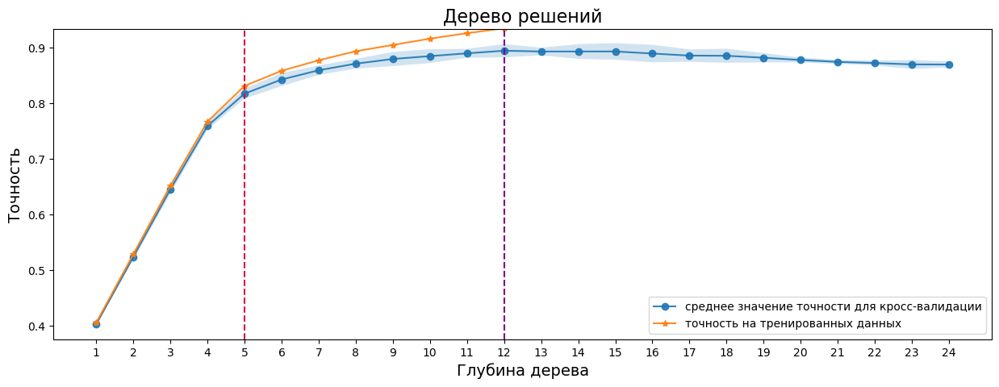

In [36]:
plot_cross_validation(tree_depths, 
                      cv_scores_mean, 
                      cv_scores_std, 
                      accuracy_scores, 
                      'Дерево решений',
                      params=[5, 12],
                      colors=['crimson', 'purple'])

In [37]:
idx_max = cv_scores_mean.argmax()
best_tree_depth = tree_depths[idx_max]
best_tree_cv_score = cv_scores_mean[idx_max]
best_tree_cv_score_std = cv_scores_std[idx_max]
print('Дерево глубины-{} достигает максимального значения точности кросс-валидации {} +/- {}% на тренировочных данных.'.format(
      best_tree_depth, round(best_tree_cv_score*100,5), round(best_tree_cv_score_std*100, 5)))

Дерево глубины-12 достигает максимального значения точности кросс-валидации 89.44 +/- 0.59783% на тренировочных данных.


In [38]:
# оценивает качество модели на обучающей и тестовой выборке
best_tree_accuracy_train, best_tree_accuracy_test = run_single_tree(X_train, y_train, 
                                                                          X_test, y_test, 
                                                                          best_tree_depth)

Глубина дерева:  12
Точность на обучающих данных:  93.93333 %
Точность на тестовых данных:  89.6 %


In [39]:
tree_model = DecisionTreeClassifier(max_depth=5, random_state=100)
tree_model.fit(X_train, y_train)
score = tree_model.score(X_test, y_test)
print(f"Дерево глубины 5 достигает {score} точности на тестовых данных.")
print(f"Предсказанные классы:\n{tree_model.predict(cases_X)}")
print(f"Точность для кейсов: {tree_model.score(cases_X, cases_y)}.")

Дерево глубины 5 достигает 0.8168 точности на тестовых данных.
Предсказанные классы:
[5 8 4 3]
Точность для кейсов: 0.75.


In [40]:
depth, score = optimal_depth(X_train, y_train, X_test, y_test)
tree_model = DecisionTreeClassifier(max_depth=depth, random_state=100)
tree_model.fit(X_train, y_train)
print(f"Дерево глубины {depth} достигает {score} точности на тестовых данных.")
print(f"Предсказанные классы:\n{tree_model.predict(cases_X)}")
print(f"Точность для кейсов: {tree_model.score(cases_X, cases_y)}.")

Дерево глубины 13 достигает 0.8992 точности на тестовых данных.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


### **PCA датасет**

In [41]:
tree_depths = range(1,25)
cv_scores_mean, cv_scores_std, accuracy_scores = run_cross_validation_on_trees(pca_X, y, tree_depths)

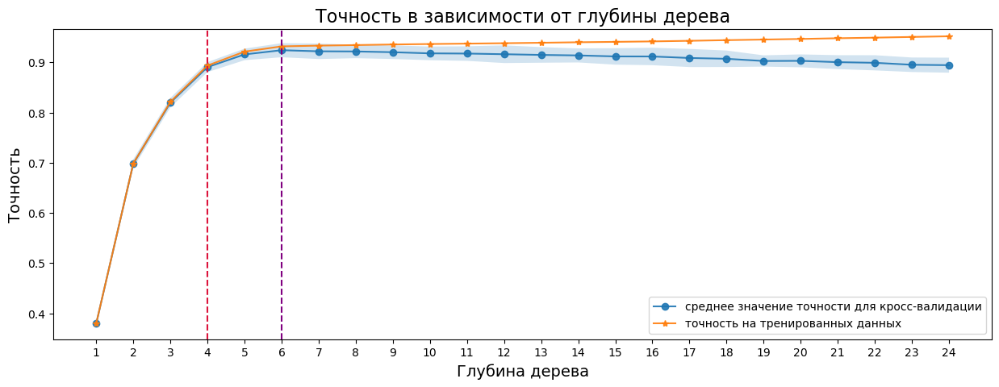

In [42]:
plot_cross_validation(tree_depths, 
                      cv_scores_mean, 
                      cv_scores_std, 
                      accuracy_scores, 
                      'Точность в зависимости от глубины дерева',
                      params=[4, 6],
                      colors=['crimson', 'purple'])

In [43]:
idx_max = cv_scores_mean.argmax()
best_tree_depth = tree_depths[idx_max]
best_tree_cv_score = cv_scores_mean[idx_max]
best_tree_cv_score_std = cv_scores_std[idx_max]
print('Дерево глубины-{} достигает максимального значения точности кросс-валидации {} +/- {}% на тренировочных данных.'.format(
      best_tree_depth, round(best_tree_cv_score*100,5), round(best_tree_cv_score_std*100, 5)))

Дерево глубины-6 достигает максимального значения точности кросс-валидации 92.4 +/- 0.7% на тренировочных данных.


In [44]:
# оценивает качество модели на обучающей и тестовой выборке
best_tree_accuracy_train, best_tree_accuracy_test = run_single_tree(pca_X_train, y_train, 
                                                                          pca_X_test, y_test, 
                                                                          best_tree_depth)

Глубина дерева:  6
Точность на обучающих данных:  93.12 %
Точность на тестовых данных:  92.64 %


In [45]:
pca_tree_model = DecisionTreeClassifier(max_depth=4, random_state=100)
pca_tree_model.fit(pca_X_train, y_train)
score = pca_tree_model.score(pca_X_test, y_test)
print(f"Дерево глубины 4 достигает {score} точности на тестовых данных.")
print(f"Предсказанные классы:\n{pca_tree_model.predict(pca_X_cases)}")
print(f"Точность для кейсов: {pca_tree_model.score(pca_X_cases, cases_y)}.")

Дерево глубины 4 достигает 0.8932 точности на тестовых данных.
Предсказанные классы:
[5 8 4 3]
Точность для кейсов: 0.75.


In [46]:
depth, score = optimal_depth(pca_X_train, y_train, pca_X_test, y_test)
pca_tree_model = DecisionTreeClassifier(max_depth=depth, random_state=100)
pca_tree_model.fit(pca_X_train, y_train)
print(f"Дерево глубины {depth} достигает {score} точности на тестовых данных.")
print(f"Предсказанные классы:\n{pca_tree_model.predict(pca_X_cases)}")
print(f"Точность для кейсов: {pca_tree_model.score(pca_X_cases, cases_y)}.")

Дерево глубины 6 достигает 0.9264 точности на тестовых данных.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


## **Случайный лес**

In [47]:
from sklearn.ensemble import RandomForestClassifier

In [48]:
# функция для обучения деревьев различной глубины в случайном лесе 
# на обучающих данных с использованием кросс-валидации
def run_cross_validation_on_forest(X, y, tree_depths, cv=5, scoring='accuracy'):
    cv_scores_list = []
    cv_scores_mean = []
    cv_scores_std = []
    accuracy_scores = []
    for depth in tree_depths:
        tree_model = RandomForestClassifier(max_depth=depth, random_state=100)
        cv_scores = cross_val_score(tree_model, X, y, cv=cv, scoring=scoring)
        cv_scores_list.append(cv_scores)
        cv_scores_mean.append(cv_scores.mean())
        cv_scores_std.append(cv_scores.std())
        accuracy_scores.append(tree_model.fit(X, y).score(X, y))
    cv_scores_mean = np.array(cv_scores_mean)
    cv_scores_std = np.array(cv_scores_std)
    accuracy_scores = np.array(accuracy_scores)
    return cv_scores_mean, cv_scores_std, accuracy_scores

In [49]:
def run_single_tree_in_forest(X_train, y_train, X_test, y_test, depth):
    model = RandomForestClassifier(max_depth=depth, random_state=100).fit(X_train, y_train)
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = model.score(X_test, y_test)
    print('Глубина дерева: ', depth)
    print('Точность на обучающих данных: ', round(accuracy_train*100,5), '%')
    print('Точность на тестовых данных: ', round(accuracy_test*100,5), '%')
    return accuracy_train, accuracy_test

In [50]:
def optimal_depth_forest(train_x, train_y, test_x, test_y):
    depth = 0
    score = 0
    for i in range(1, 15):
        tree_model = RandomForestClassifier(max_depth=i, random_state=100)
        tree_model.fit(train_x, train_y)
        tmp = tree_model.score(test_x, test_y)
        if tmp > score:
            score = tmp
            depth = i
    return depth, score

### **Обычный датасет**

In [51]:
tree_depths = range(1,11)
cv_scores_mean, cv_scores_std, accuracy_scores = run_cross_validation_on_forest(X, y, tree_depths)

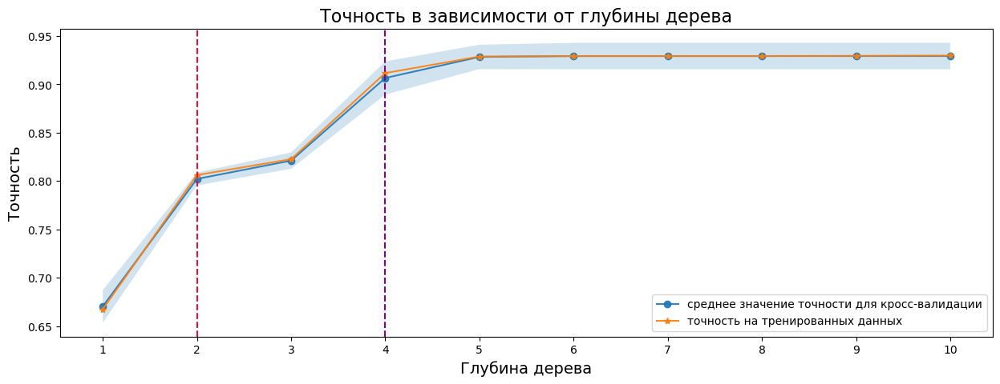

In [52]:
plot_cross_validation(tree_depths, 
                      cv_scores_mean, 
                      cv_scores_std, 
                      accuracy_scores, 
                      'Точность в зависимости от глубины дерева',
                      [2, 4],
                      ['crimson', 'purple'])

In [53]:
idx_max = cv_scores_mean.argmax()
best_tree_depth = tree_depths[idx_max]
best_tree_cv_score = cv_scores_mean[idx_max]
best_tree_cv_score_std = cv_scores_std[idx_max]
print('Случайный лес с деревом глубины-{} достигает максимального значения точности кросс-валидации {} +/- {}% на тренировочных данных.'.format(
      best_tree_depth, round(best_tree_cv_score*100,5), round(best_tree_cv_score_std*100, 5)))

Случайный лес с деревом глубины-6 достигает максимального значения точности кросс-валидации 92.93 +/- 0.68235% на тренировочных данных.


In [54]:
# оценивает качество модели на обучающей и тестовой выборке
best_tree_accuracy_train, best_tree_accuracy_test = run_single_tree_in_forest(X_train, y_train, 
                                                                              X_test, y_test, 
                                                                              best_tree_depth)

Глубина дерева:  6
Точность на обучающих данных:  92.77333 %
Точность на тестовых данных:  93.4 %


In [55]:
forest_model = RandomForestClassifier(max_depth=2, random_state=100)
forest_model.fit(X_train, y_train)
score = forest_model.score(X_test, y_test)
print(f"Случайный лес с деревом глубины 2 достигает {score} точности на тестовых данных.")
print(f"Предсказанные классы:\n{forest_model.predict(cases_X)}")
print(f"Точность для кейсов: {forest_model.score(cases_X, cases_y)}.")

Случайный лес с деревом глубины 2 достигает 0.8216 точности на тестовых данных.
Предсказанные классы:
[5 8 4 4]
Точность для кейсов: 0.75.


In [56]:
forest_model = RandomForestClassifier(max_depth=4, random_state=100)
forest_model.fit(X_train, y_train)
score = forest_model.score(X_test, y_test)
print(f"Случайный лес с деревом глубины 4 достигает {score} точности на тестовых данных.")
print(f"Предсказанные классы:\n{forest_model.predict(cases_X)}")
print(f"Точность для кейсов: {forest_model.score(cases_X, cases_y)}.")

Случайный лес с деревом глубины 4 достигает 0.922 точности на тестовых данных.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


In [57]:
depth, score = optimal_depth_forest(X_train, y_train, X_test, y_test)
forest_model = RandomForestClassifier(max_depth=depth, random_state=100)
forest_model.fit(X_train, y_train)
print(f"Случайный лес с деревом глубины {depth} достигает {score} точности на тестовых данных.")
print(f"Предсказанные классы:\n{tree_model.predict(cases_X)}")
print(f"Точность для кейсов: {tree_model.score(cases_X, cases_y)}.")

Случайный лес с деревом глубины 6 достигает 0.934 точности на тестовых данных.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


### **PCA датасет**

In [58]:
tree_depths = range(1,11)
cv_scores_mean, cv_scores_std, accuracy_scores = run_cross_validation_on_forest(pca_X, y, tree_depths)

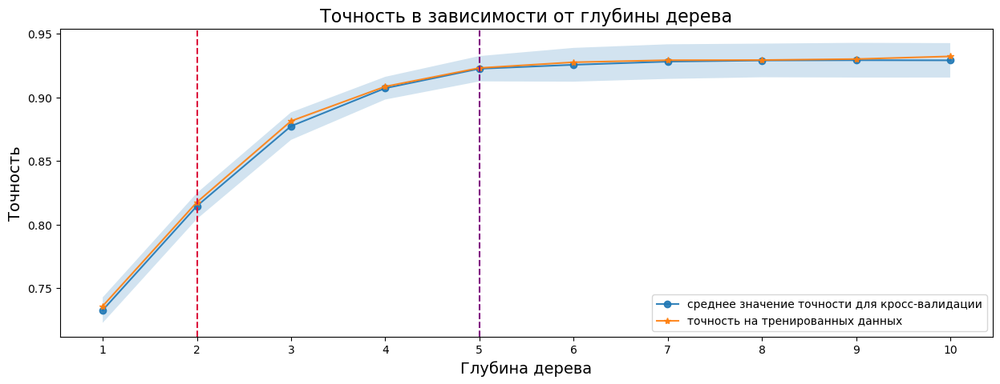

In [59]:
plot_cross_validation(tree_depths, 
                      cv_scores_mean, 
                      cv_scores_std, 
                      accuracy_scores, 
                      'Точность в зависимости от глубины дерева',
                      [2, 5],
                      ['crimson', 'purple'])

In [60]:
idx_max = cv_scores_mean.argmax()
best_tree_depth = tree_depths[idx_max]
best_tree_cv_score = cv_scores_mean[idx_max]
best_tree_cv_score_std = cv_scores_std[idx_max]
print('Случайный лес с деревом глубины-{} достигает максимального значения точности кросс-валидации {} +/- {}% на тренировочных данных.'.format(
      best_tree_depth, round(best_tree_cv_score*100,5), round(best_tree_cv_score_std*100, 5)))

Случайный лес с деревом глубины-9 достигает максимального значения точности кросс-валидации 92.93 +/- 0.68235% на тренировочных данных.


In [61]:
# оценивает качество модели на обучающей и тестовой выборке
best_tree_accuracy_train, best_tree_accuracy_test = run_single_tree_in_forest(pca_X_train, y_train, 
                                                                              pca_X_test, y_test, 
                                                                              best_tree_depth)

Глубина дерева:  9
Точность на обучающих данных:  92.96 %
Точность на тестовых данных:  93.4 %


In [62]:
pca_forest_model = RandomForestClassifier(max_depth=2, random_state=100)
pca_forest_model.fit(pca_X_train, y_train)
score = pca_forest_model.score(pca_X_test, y_test)
print(f"Случайный лес с деревом глубины 2 достигает {score} точности на тестовых данных.")
print(f"Предсказанные классы:\n{pca_forest_model.predict(pca_X_cases)}")
print(f"Точность для кейсов: {pca_forest_model.score(pca_X_cases, cases_y)}.")

Случайный лес с деревом глубины 2 достигает 0.824 точности на тестовых данных.
Предсказанные классы:
[5 8 4 8]
Точность для кейсов: 0.75.


In [63]:
pca_forest_model = RandomForestClassifier(max_depth=5, random_state=100)
pca_forest_model.fit(pca_X_train, y_train)
score = pca_forest_model.score(pca_X_test, y_test)
print(f"Случайный лес с деревом глубины 5 достигает {score} точности на тестовых данных.")
print(f"Предсказанные классы:\n{pca_forest_model.predict(pca_X_cases)}")
print(f"Точность для кейсов: {pca_forest_model.score(pca_X_cases, cases_y)}.")

Случайный лес с деревом глубины 5 достигает 0.9284 точности на тестовых данных.
Предсказанные классы:
[5 8 4 8]
Точность для кейсов: 0.75.


In [64]:
depth, score = optimal_depth_forest(pca_X_train, y_train, pca_X_test, y_test)
forest_model = RandomForestClassifier(max_depth=depth, random_state=100)
forest_model.fit(pca_X_train, y_train)
print(f"Случайный лес с деревом глубины {depth} достигает {score} точности на тестовых данных.")
print(f"Предсказанные классы:\n{forest_model.predict(pca_X_cases)}")
print(f"Точность для кейсов: {forest_model.score(pca_X_cases, cases_y)}.")

Случайный лес с деревом глубины 8 достигает 0.934 точности на тестовых данных.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


## **Метод опорных векторов**

In [65]:
from sklearn import svm

In [66]:
def svm_kernels(X_train, y_train, X_test, y_test, cases_X, cases_y):
    kernels = ['linear', 'poly', 'rbf', 'sigmoid']
    for ker in kernels:
        svm_model = svm.SVC(kernel=ker)
        svm_model.fit(X_train, y_train)
        print(f"Для ядра {ker}:")
        print(f"точность на тестовой выборке: {svm_model.score(X_test, y_test)}.")
        print(f"предсказанные классы:\n{svm_model.predict(cases_X)}")
        print(f"точность для кейсов: {svm_model.score(cases_X, cases_y)}.")
        print("\n")

### **Обычный датасет**

In [67]:
svm_kernels(X_train, y_train, X_test, y_test, cases_X, cases_y)

Для ядра linear:
точность на тестовой выборке: 0.9216.
предсказанные классы:
[5 8 4 2]
точность для кейсов: 1.0.


Для ядра poly:
точность на тестовой выборке: 0.934.
предсказанные классы:
[5 8 4 2]
точность для кейсов: 1.0.


Для ядра rbf:
точность на тестовой выборке: 0.934.
предсказанные классы:
[5 8 4 2]
точность для кейсов: 1.0.


Для ядра sigmoid:
точность на тестовой выборке: 0.9336.
предсказанные классы:
[5 8 4 2]
точность для кейсов: 1.0.




### **PCA датасет**

In [68]:
svm_kernels(pca_X_train, y_train, pca_X_test, y_test, pca_X_cases, cases_y)

Для ядра linear:
точность на тестовой выборке: 0.9216.
предсказанные классы:
[5 8 4 2]
точность для кейсов: 1.0.


Для ядра poly:
точность на тестовой выборке: 0.934.
предсказанные классы:
[5 8 4 2]
точность для кейсов: 1.0.


Для ядра rbf:
точность на тестовой выборке: 0.934.
предсказанные классы:
[5 8 4 2]
точность для кейсов: 1.0.


Для ядра sigmoid:
точность на тестовой выборке: 0.9336.
предсказанные классы:
[5 8 4 2]
точность для кейсов: 1.0.




## **Наивный Байес**

In [69]:
import sklearn.naive_bayes

### **Обычный датасет**

#### **Бернулли**

In [70]:
naive_model_bern = sklearn.naive_bayes.BernoulliNB(force_alpha=True).fit(X_train, y_train)
print(f"Точность на тестовой выборке: {naive_model_bern.score(X_test, y_test)}.")
print(f"Предсказанные классы:\n{naive_model_bern.predict(cases_X)}")
print(f"Точность для кейсов: {naive_model_bern.score(cases_X, cases_y)}.")

Точность на тестовой выборке: 0.934.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


#### **Дополняющий**

In [71]:
naive_model_comp = sklearn.naive_bayes.ComplementNB(force_alpha=True).fit(X_train, y_train)
print(f"Точность на тестовой выборке: {naive_model_comp.score(X_test, y_test)}.")
print(f"Предсказанные классы:\n{naive_model_comp.predict(cases_X)}")
print(f"Точность для кейсов: {naive_model_comp.score(cases_X, cases_y)}.")

Точность на тестовой выборке: 0.9304.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


#### **Гауссовкий**

In [72]:
naive_model_gaus = sklearn.naive_bayes.GaussianNB().fit(X_train, y_train)
print(f"Точность на тестовой выборке: {naive_model_gaus.score(X_test, y_test)}.")
print(f"Предсказанные классы:\n{naive_model_gaus.predict(cases_X)}")
print(f"Точность для кейсов: {naive_model_gaus.score(cases_X, cases_y)}.")

Точность на тестовой выборке: 0.9276.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


#### **Полиномиальный**

In [73]:
naive_model_multi = sklearn.naive_bayes.MultinomialNB(force_alpha=True).fit(X_train, y_train)
print(f"Точность на тестовой выборке: {naive_model_multi.score(X_test, y_test)}.")
print(f"Предсказанные классы:\n{naive_model_multi.predict(cases_X)}")
print(f"Точность для кейсов: {naive_model_multi.score(cases_X, cases_y)}.")

Точность на тестовой выборке: 0.934.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


### **PCA датасет**

#### **Бернулли**

In [74]:
pca_naive_model_bern = sklearn.naive_bayes.BernoulliNB(force_alpha=True).fit(pca_X_train, y_train)
print(f"Точность на тестовой выборке: {pca_naive_model_bern.score(pca_X_test, y_test)}.")
print(f"Предсказанные классы:\n{pca_naive_model_bern.predict(pca_X_cases)}")
print(f"Точность для кейсов: {pca_naive_model_bern.score(pca_X_cases, cases_y)}.")

Точность на тестовой выборке: 0.914.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


#### **Дополняющий**

***Комментарий:*** невозможно вычислить, так как в датасете PCA содержатся отрицательные числа, в то время как предполагается, что функции имеют полиномиальное распределение, которое является обобщением биномиального распределения, а ни биномиальные, ни полиномиальные распределения не могут содержать отрицательных значений.

#### **Гауссовкий**

In [75]:
pca_naive_model_gaus = sklearn.naive_bayes.GaussianNB().fit(pca_X_train, y_train)
print(f"Точность на тестовой выборке: {pca_naive_model_gaus.score(pca_X_test, y_test)}.")
print(f"Предсказанные классы:\n{pca_naive_model_gaus.predict(pca_X_cases)}")
print(f"Точность для кейсов: {pca_naive_model_gaus.score(pca_X_cases, cases_y)}.")

Точность на тестовой выборке: 0.8916.
Предсказанные классы:
[2 1 4 2]
Точность для кейсов: 0.5.


#### **Полиномиальный**

***Комментарий:*** невозможно вычислить, так как в датасете PCA содержатся отрицательные числа, в то время как предполагается, что функции имеют полиномиальное распределение, которое является обобщением биномиального распределения, а ни биномиальные, ни полиномиальные распределения не могут содержать отрицательных значений.

## **KNN**

In [76]:
from sklearn.neighbors import KNeighborsClassifier

### **Обычный датасет**

In [77]:
k_range = range(1, 21)
k_scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X, y, cv=5, scoring='accuracy')
    k_scores.append(scores.mean())

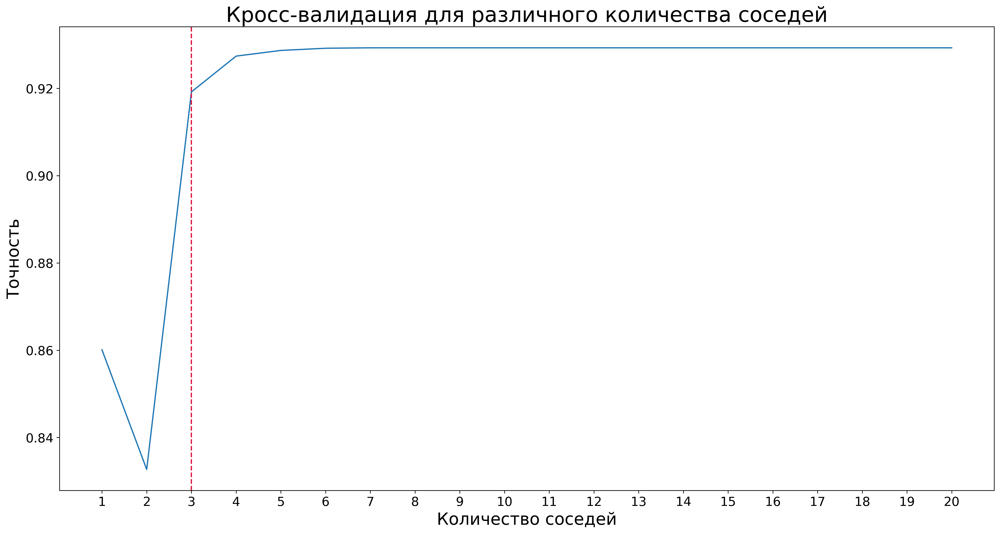

In [78]:
plt.figure(figsize=(20, 10), dpi=300) 
plt.plot(k_range, k_scores)
plt.title("Кросс-валидация для различного количества соседей", fontsize=25)
plt.xlabel('Количество соседей', fontsize=20)
plt.ylabel('Точность', fontsize=20)
plt.tick_params(axis = 'x', labelsize = 15) 
plt.tick_params(axis = 'y', labelsize = 15)
plt.xticks(k_range)
plt.axvline(3, 0, 1, color='crimson', linestyle='--')
plt.show()

In [79]:
knn_model = KNeighborsClassifier(n_neighbors=3).fit(X_train, y_train)
print(f"Точность на тестовой выборке: {knn_model.score(X_test, y_test)}.")
print(f"Предсказанные классы:\n{knn_model.predict(cases_X)}")
print(f"Точность для кейсов: {knn_model.score(cases_X, cases_y)}.")

Точность на тестовой выборке: 0.9108.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.


### **PCA датасет**

In [80]:
k_range = range(1, 21)
pca_k_scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, pca_X, y, cv=5, scoring='accuracy')
    pca_k_scores.append(scores.mean())

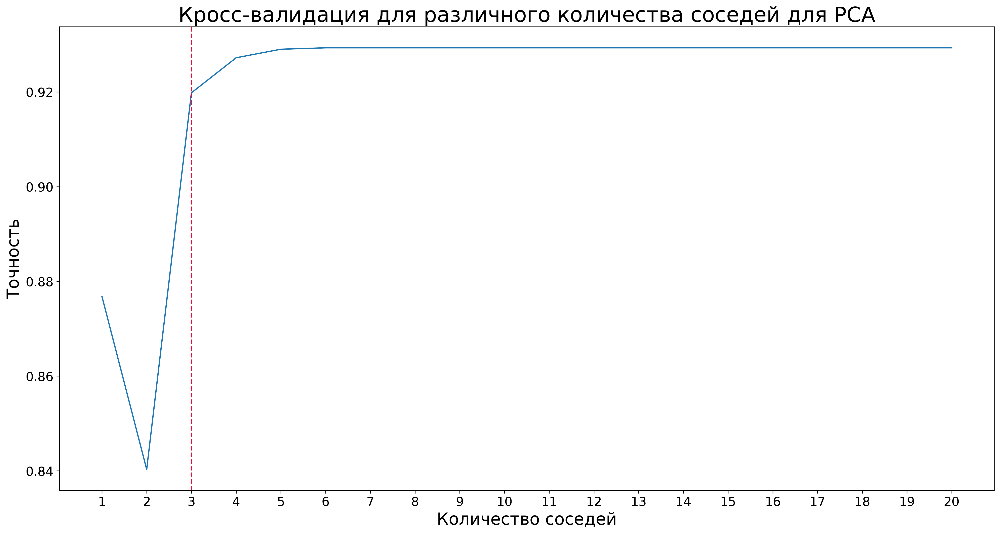

In [81]:
plt.figure(figsize=(20, 10), dpi=300) 
plt.plot(k_range, pca_k_scores)
plt.title("Кросс-валидация для различного количества соседей для PCA", fontsize=25)
plt.xlabel('Количество соседей', fontsize=20)
plt.ylabel('Точность', fontsize=20)
plt.tick_params(axis = 'x', labelsize = 15) 
plt.tick_params(axis = 'y', labelsize = 15)
plt.xticks(k_range)
plt.axvline(3, 0, 1, color='crimson', linestyle='--')
plt.show()

In [82]:
pca_knn_model = KNeighborsClassifier(n_neighbors=3).fit(pca_X_train, y_train)
print(f"Точность на тестовой выборке: {pca_knn_model.score(pca_X_test, y_test)}.")
print(f"Предсказанные классы:\n{pca_knn_model.predict(pca_X_cases)}")
print(f"Точность для кейсов: {pca_knn_model.score(pca_X_cases, cases_y)}.")

Точность на тестовой выборке: 0.9092.
Предсказанные классы:
[5 8 4 2]
Точность для кейсов: 1.0.
